In [1]:
import numpy as np
import math

from matplotlib import pyplot as plt
from matplotlib import animation, rcParams
from tqdm.notebook import tqdm

from IPython.display import clear_output, HTML

rcParams['font.family'] = 'sans-serif'
rcParams['savefig.bbox'] = 'tight'

In [2]:
def plot(x, f, t):
    plt.figure(figsize=(15, 9))
    plt.plot(x, f, color='black', marker='.', lw=1)
    plt.xlim(t-0.1, t+0.1)
    plt.grid()
    plt.xlabel('$x$')
    plt.ylabel('$f(x)$')

## 1D mesh & initial values

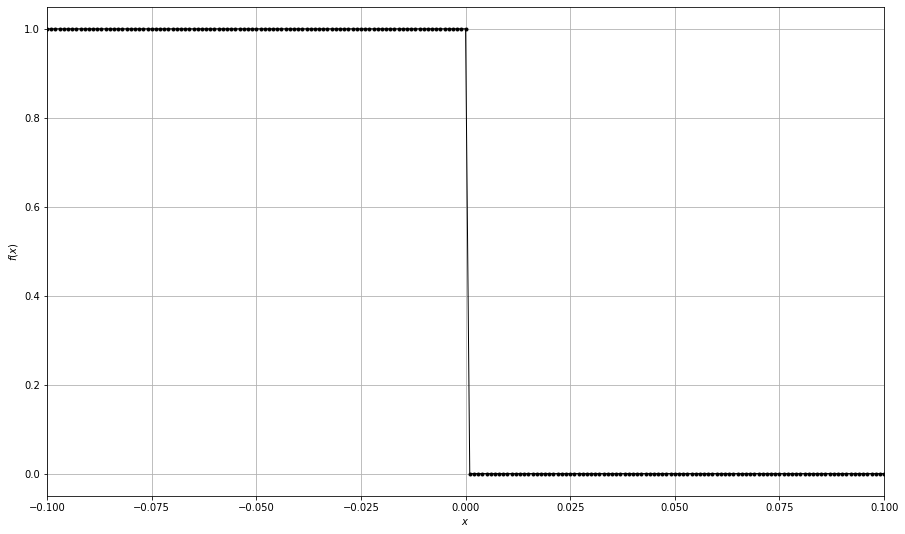

In [3]:
x = np.linspace(-1, 16, 17001)
f = np.where(x > 0, 0.0, 1.0)
plot(x, f, 0)

## 2-parametric numerical methods

In [4]:
def NM(f0, u, t0, T, h, C, a, b):
    tau = C * h / u
    t = np.arange(t0, T, tau)
    nt = t.shape[0]
    F = np.zeros((nt, f0.shape[0]))
    F[0] = f0.copy().reshape(1, -1)
    
    def step(f_prev):
        if u >= 0:
            f_m = a * f_prev[:-4] + (1 - a - b) * f_prev[1:-3] + b * f_prev[2:-2]
            f_p = a * f_prev[1:-3] + (1 - a - b) * f_prev[2:-2] + b * f_prev[3:-1]
        else:
            f_m = a * f_prev[3:-1] + (1 - a - b) * f_prev[2:-2] + b * f_prev[1:-3]
            f_p = a * f_prev[4:] + (1 - a - b) * f_prev[3:-1] + b * f_prev[2:-2]
        return f_prev[2:-2] - tau * u / h * (f_p - f_m)
    
    for i in tqdm(range(nt - 1)):
        F[i+1, 2:-2] = step(F[i])
    return F, t

In [5]:
def Godunov(f0, u, t0, T, h, C):
    return NM(f0, u, t0, T, h, C, 0, 0)

  0%|          | 0/19999 [00:00<?, ?it/s]

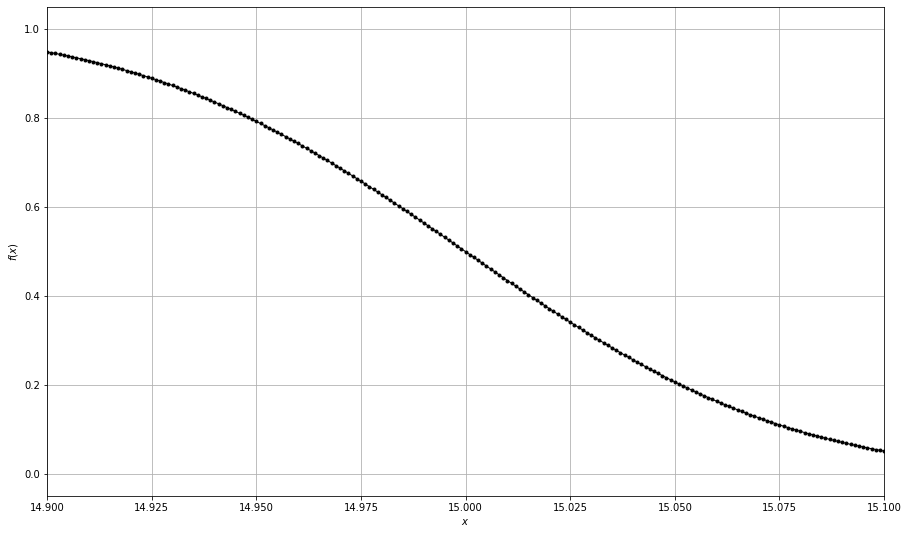

In [6]:
F, _ = Godunov(
    f0 = f,
    u = 1,
    t0 = 0,
    T = 15,
    h = 0.001,
    C = 0.75,
)
plot(
    x = x,
    f = F[-1],
    t = 15
)

In [7]:
def MacCormack(f0, u, t0, T, h, C):
    return NM(f0, u, t0, T, h, C, 0, 0.5 * (1 - C))

  0%|          | 0/19999 [00:00<?, ?it/s]

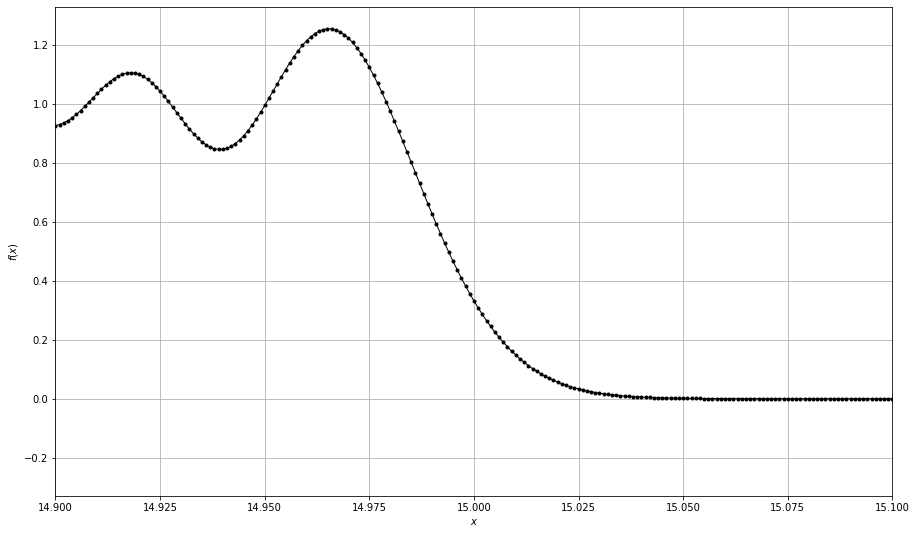

In [8]:
F, _ = MacCormack(
    f0 = f,
    u = 1,
    t0 = 0,
    T = 15,
    h = 0.001,
    C = 0.75,
)
plot(
    x = x,
    f = F[-1],
    t = 15
)

In [9]:
def Holodov(f0, u, t0, T, h, C):
    return NM(f0, u, t0, T, h, C, -0.25*(1 - C), 0.25*(1 - C))

  0%|          | 0/19999 [00:00<?, ?it/s]

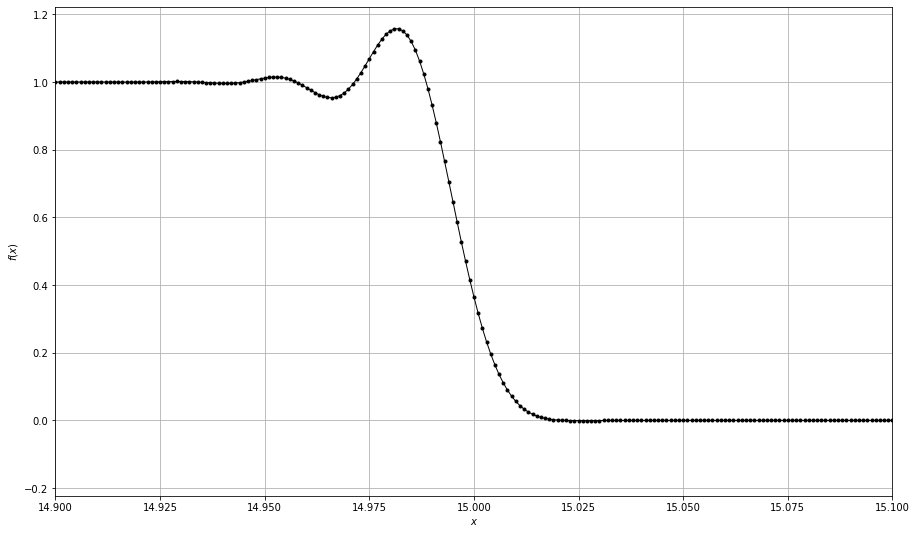

In [10]:
F, _ = Holodov(
    f0 = f,
    u = 1,
    t0 = 0,
    T = 15,
    h = 0.001,
    C = 0.75,
)
plot(
    x = x,
    f = F[-1],
    t = 15
)

In [11]:
def ThirdOrder(f0, u, t0, T, h, C):
    return NM(f0, u, t0, T, h, C, (C**2 - 1)/6, (1 - C)*(2 - C)/6)

  0%|          | 0/19999 [00:00<?, ?it/s]

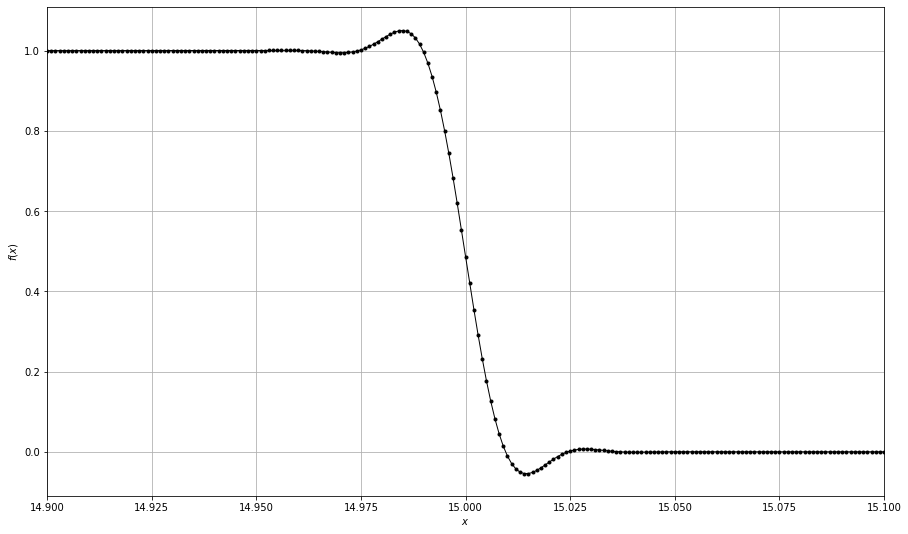

In [12]:
F, _ = ThirdOrder(
    f0 = f,
    u = 1,
    t0 = 0,
    T = 15,
    h = 0.001,
    C = 0.75,
)
plot(
    x = x,
    f = F[-1],
    t = 15
)

In [13]:
def Hybrid(f0, u, t0, T, h, C):
    tau = C * h / u
    t = np.arange(t0, T, tau)
    nt = t.shape[0]
    F = np.zeros((nt, f0.shape[0]))
    F[0] = f0.copy().reshape(1, -1)
    
    def step(f_prev, a, b):
        if u >= 0:
            f_m = a * f_prev[:-4] + (1 - a - b) * f_prev[1:-3] + b * f_prev[2:-2]
            f_p = a * f_prev[1:-3] + (1 - a - b) * f_prev[2:-2] + b * f_prev[3:-1]
        else:
            f_m = a * f_prev[3:-1] + (1 - a - b) * f_prev[2:-2] + b * f_prev[1:-3]
            f_p = a * f_prev[4:] + (1 - a - b) * f_prev[3:-1] + b * f_prev[2:-2]
        return f_prev[2:-2] - tau * u / h * (f_p - f_m)
    
    for i in tqdm(range(nt - 1)):
        delta = F[i, 2:] - F[i, 1:-1]
        delta2 = delta[1:-1] - delta[:-2]
        delta = delta[1:-1]
        F[i+1, 2:-2] = np.where(
            u * delta * delta2 <= 0,
            step(F[i], 0, 0.5 * (1 - C)),
            step(F[i], -0.5 * (1 - C), 0)
        )
    return F, t

  0%|          | 0/19999 [00:00<?, ?it/s]

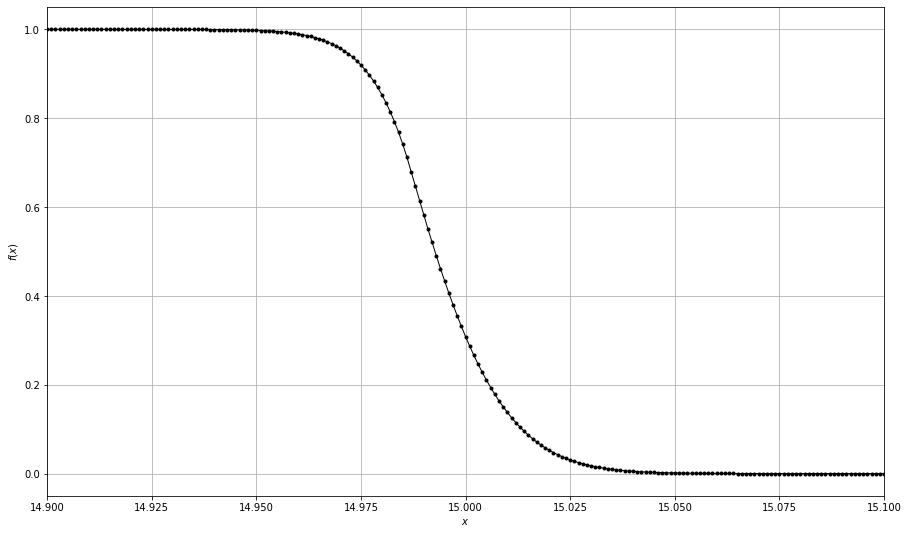

In [14]:
F, _ = Hybrid(
    f0 = f,
    u = 1,
    t0 = 0,
    T = 15,
    h = 0.001,
    C = 0.75,
)
plot(
    x = x,
    f = F[-1],
    t = 15
)

In [15]:
def plot_all(C, T):
    x = np.linspace(-1, 16, 17001)
    f0 = np.where(x > 0, 0.0, 1.0)
    F_Godunov, t = Godunov(f0=f0, u=1, t0=0, T=T, h=0.001, C=C)
    f_Godunov = F_Godunov[-1].copy()
    del F_Godunov
    F_MacCormack, _ = MacCormack(f0=f0, u=1, t0=0, T=T, h=0.001, C=C)
    f_MacCormack = F_MacCormack[-1].copy()
    del F_MacCormack
    F_Holodov, _ = Holodov(f0=f0, u=1, t0=0, T=T, h=0.001, C=C)
    f_Holodov = F_Holodov[-1].copy()
    del F_Holodov
    F_ThirdOrder, _ = ThirdOrder(f0=f0, u=1, t0=0, T=T, h=0.001, C=C)
    f_ThirdOrder = F_ThirdOrder[-1].copy()
    del F_ThirdOrder
    F_Hybrid, _ = Hybrid(f0=f0, u=1, t0=0, T=T, h=0.001, C=C)
    f_Hybrid = F_Hybrid[-1].copy()
    del F_Hybrid
    del f0
    plt.figure(figsize=(15, 9))
    plt.title(f'C = {C}, T = {T}')
    plt.plot(x, f_Godunov, marker='.', lw=1, label='Godunov')
    plt.plot(x, f_MacCormack, marker='+', lw=1, label='MacCormack')
    plt.plot(x, f_Holodov, marker='x', lw=1, label='Holodov')
    plt.plot(x, f_ThirdOrder, marker='*', lw=1, label='Third Order')
    plt.plot(x, f_Hybrid, marker='.', lw=1, label='Hybrid')
    plt.xlim(t[-1]-0.1, t[-1]+0.1)
    plt.grid()
    plt.legend()
    plt.xlabel('$x$')
    plt.ylabel('$f(x)$')

  0%|          | 0/13333 [00:00<?, ?it/s]

  0%|          | 0/13333 [00:00<?, ?it/s]

  0%|          | 0/13333 [00:00<?, ?it/s]

  0%|          | 0/13333 [00:00<?, ?it/s]

  0%|          | 0/13333 [00:00<?, ?it/s]

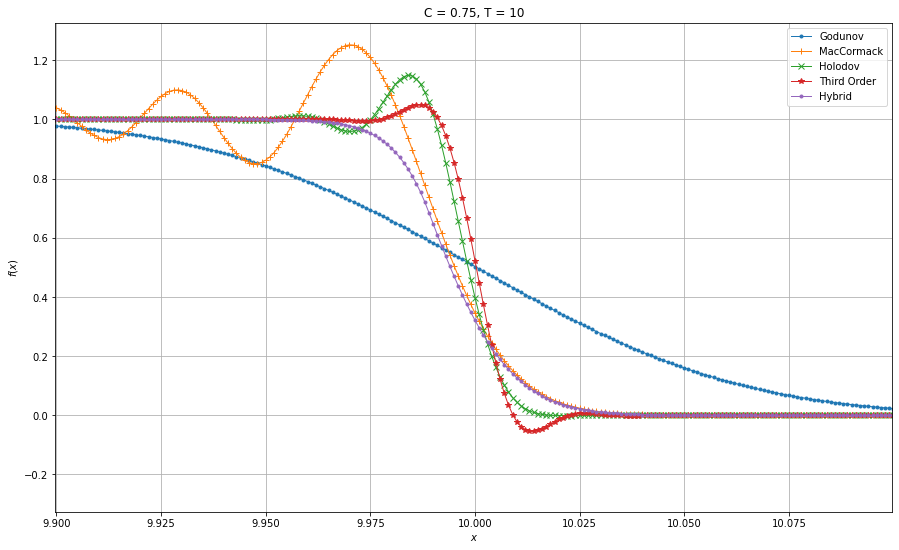

In [16]:
plot_all(0.75, 10)

  0%|          | 0/19999 [00:00<?, ?it/s]

  0%|          | 0/19999 [00:00<?, ?it/s]

  0%|          | 0/19999 [00:00<?, ?it/s]

  0%|          | 0/19999 [00:00<?, ?it/s]

  0%|          | 0/19999 [00:00<?, ?it/s]

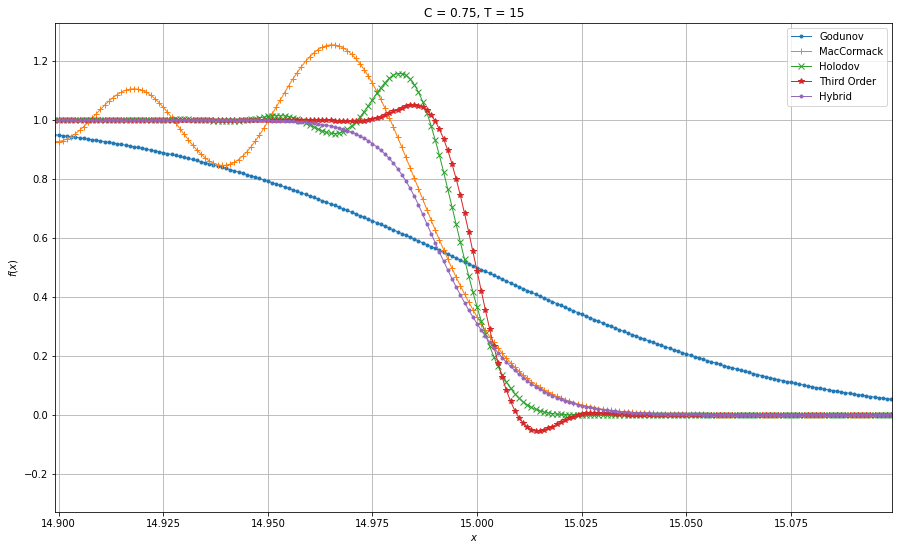

In [17]:
plot_all(0.75, 15)

  0%|          | 0/10526 [00:00<?, ?it/s]

  0%|          | 0/10526 [00:00<?, ?it/s]

  0%|          | 0/10526 [00:00<?, ?it/s]

  0%|          | 0/10526 [00:00<?, ?it/s]

  0%|          | 0/10526 [00:00<?, ?it/s]

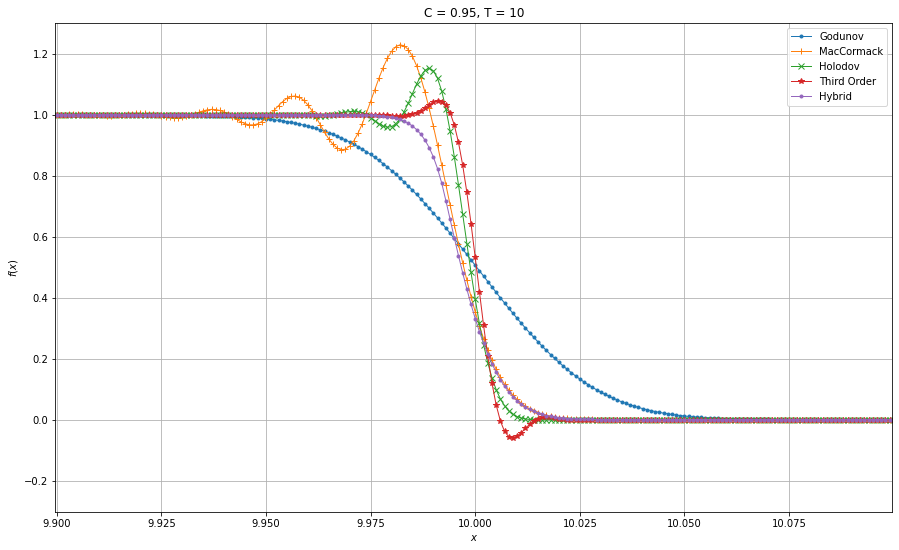

In [18]:
plot_all(0.95, 10)

  0%|          | 0/15789 [00:00<?, ?it/s]

  0%|          | 0/15789 [00:00<?, ?it/s]

  0%|          | 0/15789 [00:00<?, ?it/s]

  0%|          | 0/15789 [00:00<?, ?it/s]

  0%|          | 0/15789 [00:00<?, ?it/s]

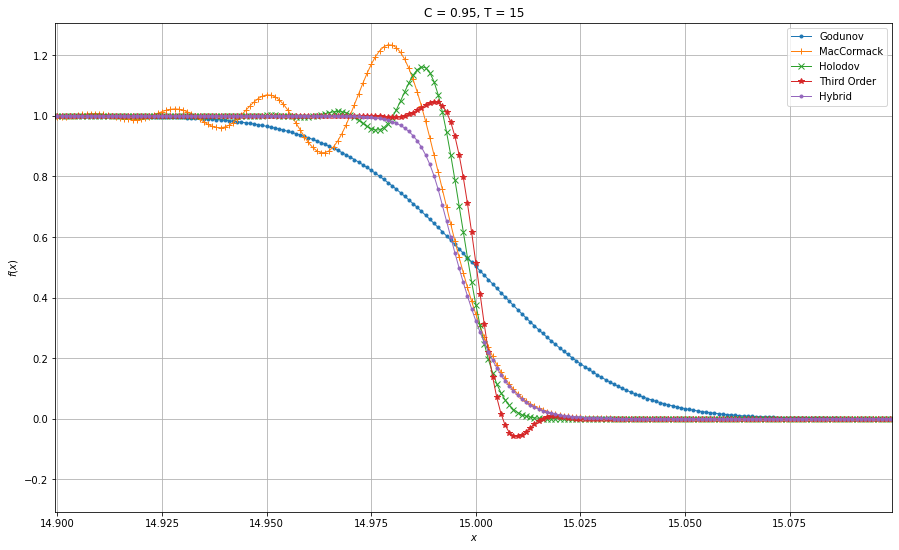

In [19]:
plot_all(0.95, 15)

In [20]:
def animate_all(C):
    x = np.linspace(-1, 21, 22001)
    f0 = np.where(x > 0, 0.0, 1.0)
    F_Godunov, t = Godunov(f0=f0, u=1, t0=0, T=20, h=0.001, C=C)
    f_Godunov = F_Godunov[::50].copy()
    del F_Godunov
    t = t[::50].copy()
    F_MacCormack, _ = MacCormack(f0=f0, u=1, t0=0, T=20, h=0.001, C=C)
    f_MacCormack = F_MacCormack[::50].copy()
    del F_MacCormack
    F_Holodov, _ = Holodov(f0=f0, u=1, t0=0, T=20, h=0.001, C=C)
    f_Holodov = F_Holodov[::50].copy()
    del F_Holodov
    F_ThirdOrder, _ = ThirdOrder(f0=f0, u=1, t0=0, T=20, h=0.001, C=C)
    f_ThirdOrder = F_ThirdOrder[::50].copy()
    del F_ThirdOrder
    F_Hybrid, _ = Hybrid(f0=f0, u=1, t0=0, T=20, h=0.001, C=C)
    f_Hybrid = F_Hybrid[::50].copy()
    del F_Hybrid
    del f0
    
    
    def anim_plot(f_t, ax, x):
        f_Godunov, f_MacCormack, f_Holodov, f_ThirdOrder, f_Hybrid, t = f_t
        ax.clear()
        ax.set_title(f'C = {C}, t = {round(t, 2)}')
        
        ax.plot(x, f_Godunov, marker='.', lw=1, label='Godunov')
        ax.plot(x, f_MacCormack, marker='+', lw=1, label='MacCormack')
        ax.plot(x, f_Holodov, marker='x', lw=1, label='Holodov')
        ax.plot(x, f_ThirdOrder, marker='*', lw=1, label='Third Order')
        ax.plot(x, f_Hybrid, marker='.', lw=1, label='Hybrid')
        
        ax.set_xlim(t-0.1, t+0.1)
        ax.set_xlabel('$x$')
        ax.set_ylabel('$f(x)$')
        ax.grid()
        ax.legend()

    fig, ax = plt.subplots(figsize=(20, 15))

    return animation.FuncAnimation(fig, anim_plot, frames=list(zip(f_Godunov, f_MacCormack, f_Holodov, f_ThirdOrder, f_Hybrid, t)), interval=200, fargs=(ax, x))

  0%|          | 0/26666 [00:00<?, ?it/s]

  0%|          | 0/26666 [00:00<?, ?it/s]

  0%|          | 0/26666 [00:00<?, ?it/s]

  0%|          | 0/26666 [00:00<?, ?it/s]

  0%|          | 0/26666 [00:00<?, ?it/s]

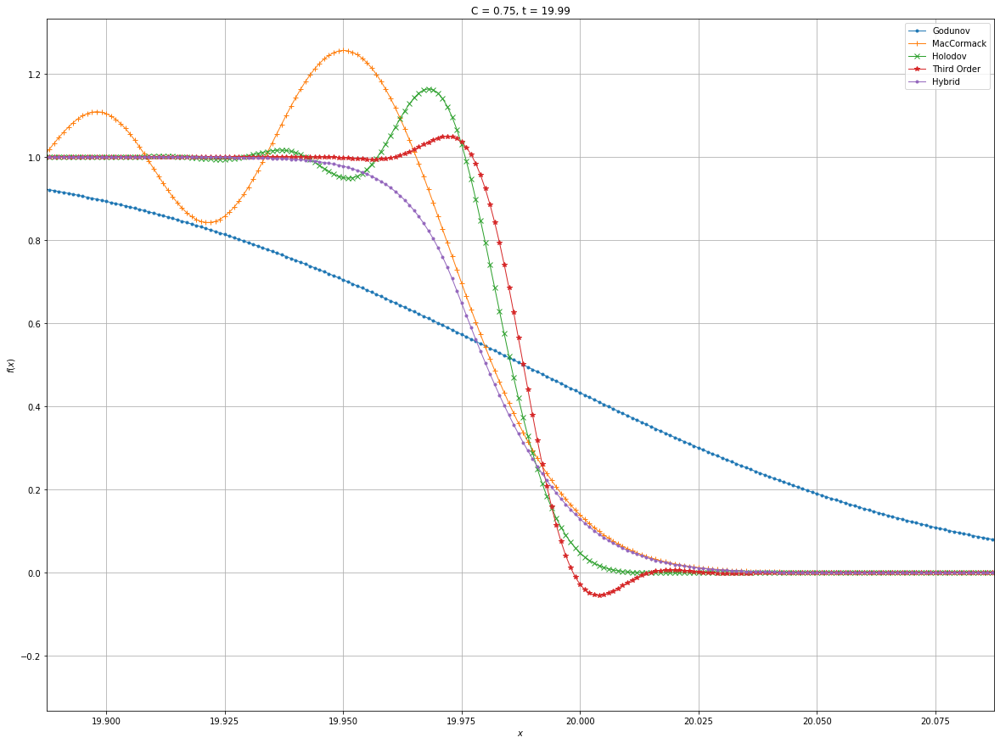

In [21]:
HTML(animate_all(0.75).to_html5_video())

  0%|          | 0/21052 [00:00<?, ?it/s]

  0%|          | 0/21052 [00:00<?, ?it/s]

  0%|          | 0/21052 [00:00<?, ?it/s]

  0%|          | 0/21052 [00:00<?, ?it/s]

  0%|          | 0/21052 [00:00<?, ?it/s]

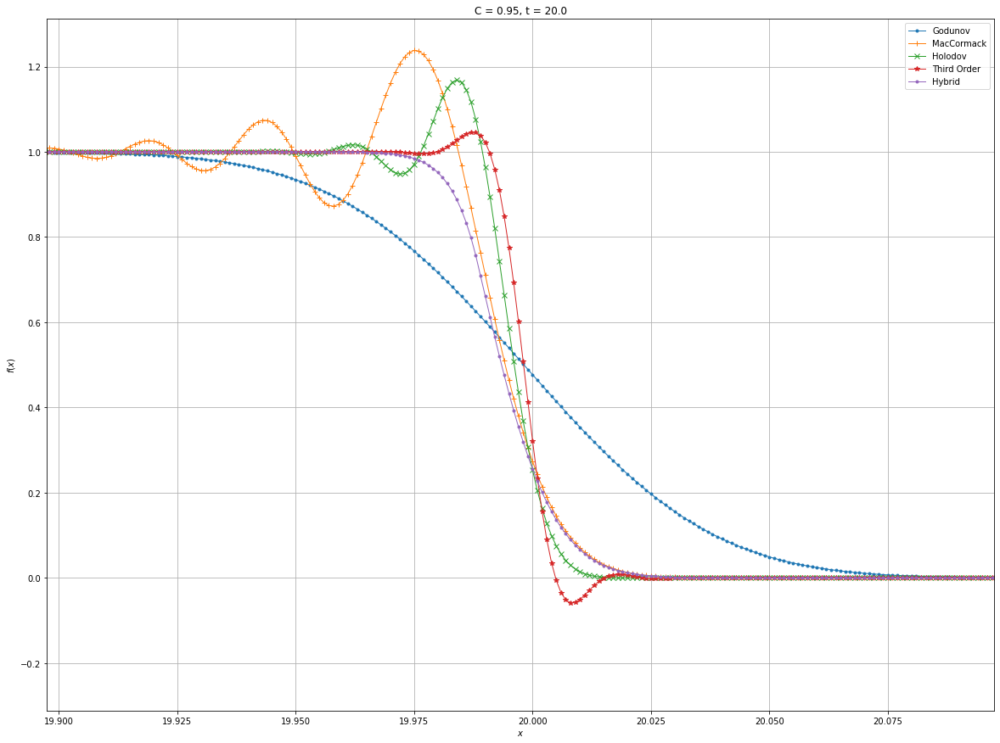

In [22]:
HTML(animate_all(0.95).to_html5_video())

# References

1. _V. A. Gushchin_ On a one family of quasimonotone finite-difference schemes of the second order of approximation. 2016